In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pylab as plt
import pickle
import scipy
from scipy import linalg
import tensorflow as tf
import sklearn
import math

from sklearn.preprocessing import StandardScaler

/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
movie_path = "/Users/rana/Desktop/Broad/QS_fov2_4v_at124000.bin"
num_frames = 7082
frame_height = 100
frame_width = 850
sub_frame_size = 80

In [3]:
# load movie and reshape it
with open(movie_path, mode='rb') as f:
    raw_movie = np.fromfile(f, dtype='uint16')
reshaped_movie = raw_movie.reshape((num_frames, frame_height, frame_width))

In [4]:
#Flattening reshaped movie
flattened_2D_movie = reshaped_movie.reshape(num_frames, frame_height*frame_width)
print(flattened_2D_movie.shape)


(7082, 85000)


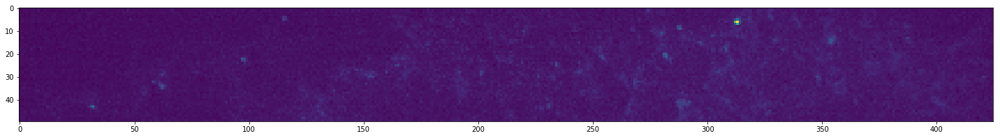

In [5]:
frame_index =500
pixel_skip = 2
resized_movie = reshaped_movie[:, ::pixel_skip, ::pixel_skip]
#make bigger size
fig = plt.figure(figsize=(25,25))
plt.imshow(resized_movie[frame_index, :, :], interpolation='nearest')

In [6]:
print(resized_movie.shape)
n_frames,pix_x, pix_y = resized_movie.shape
flat_pix = pix_x*pix_y
print(flat_pix)

(7082, 50, 425)
21250


In [7]:
rm = resized_movie.reshape(n_frames, pix_x*pix_y)
print(rm.shape)

(7082, 21250)


In [8]:
resized_movie_shape = resized_movie.shape
flattened_resized_movie = resized_movie.reshape(num_frames, resized_movie_shape[1] * resized_movie_shape[2])
print(flattened_resized_movie.shape)

(7082, 21250)


In [9]:
#PCA

In [10]:
#Covariance matrix

In [11]:
ims_flat = flattened_resized_movie #.astype('float64')
print(ims_flat.shape) #(7499, flat_pix)

#Standardizing original matrix
ims_std = StandardScaler().fit_transform(ims_flat) #(7499, flat_pix)
print(ims_std.shape) #(7499, flat_pix)

#Covariance of original matrix
cov_mat = np.cov(ims_std.T)
print(cov_mat.shape) #(flat_pix, flat_pix)

(7082, 21250)


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype uint16 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


(7082, 21250)
(21250, 21250)


In [12]:
#Finding Eigenvalues and Eigenvectors of original matrix
eig_vals, eig_vecs = np.linalg.eigh(cov_mat)
print(eig_vals.shape) #(flat_pix,)
print(eig_vecs.shape) #(flat_pix, flat_pix)

(21250,)
(21250, 21250)


In [13]:
#Rank the eigenvalues from highest to lowest

In [14]:
idx = eig_vals.argsort()[::-1]   
eigenValues = eig_vals[idx]
eigenVectors = eig_vecs[:, idx]

In [15]:
# k = no. of eigenvectors to choose
k = 7

In [16]:
#choose k eigen vectors and eigen values
k_eigenValues = eigenValues[:k]  #(k,)
print(k_eigenValues.shape)
k_eigenVectors = eigenVectors[:, :k] #(3708, k)
print(k_eigenVectors.shape)

(7,)
(21250, 7)


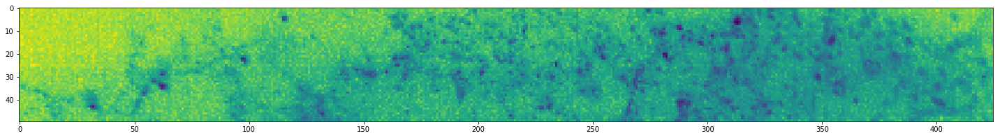

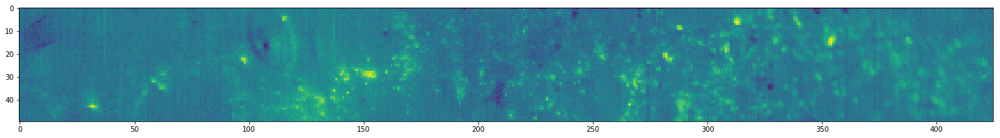

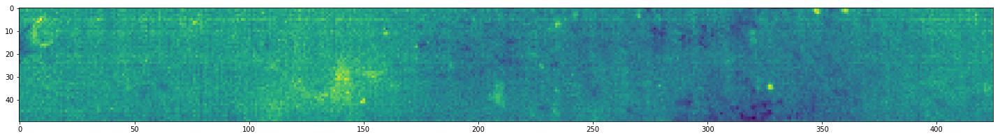

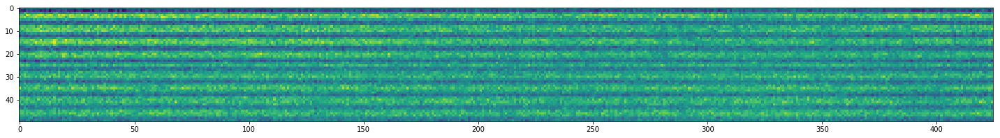

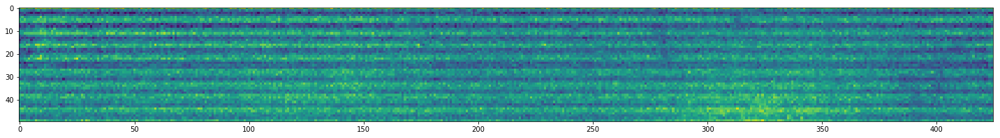

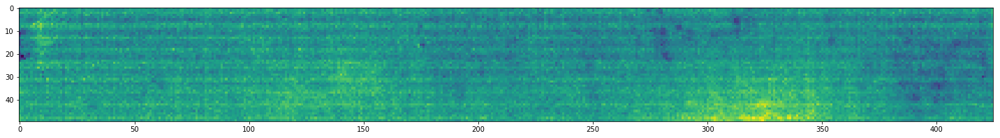

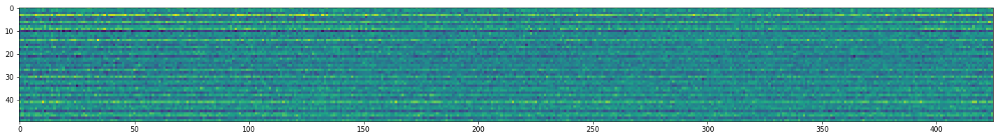

In [17]:
#Plot eigen vectors
for i in range(k):
    #make bigger size
    fig = plt.figure(figsize=(25,25))
    plt.imshow(k_eigenVectors[:, i].reshape((pix_x, pix_y)))
    plt.show() 


In [18]:
#Explained variance

(21250,)


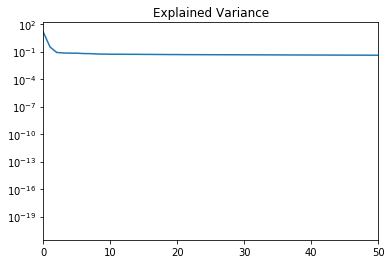

Text(0.5,1,'Cumulative Explained Variance')

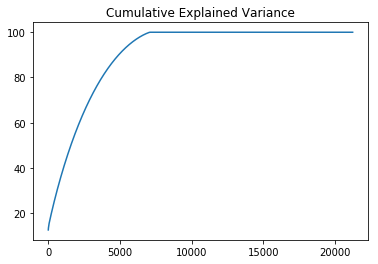

In [19]:
tot = np.sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
#cumsum returns the cumulative sum of the elements along a given axis.
cum_var_exp = np.cumsum(var_exp)
print(cum_var_exp.shape) 
plt.plot(var_exp)
plt.title('Explained Variance')
plt.yscale('log')
plt.xlim((0,50))
plt.show()
plt.plot(cum_var_exp)
plt.title('Cumulative Explained Variance')

In [20]:
#Projection Matrix

projection_matrix shape:  (7, 21250)
k eig vecs shape:  (21250, 7)


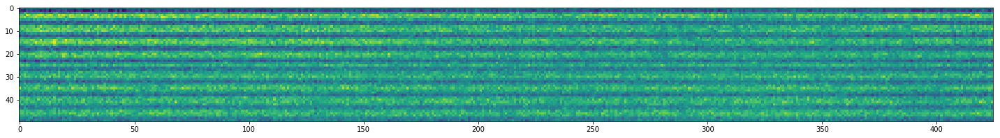

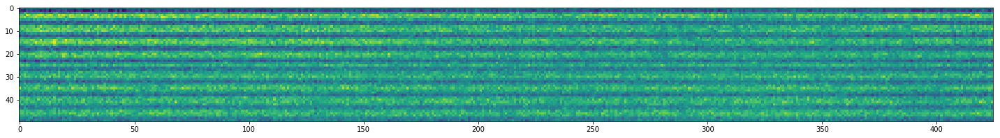

In [21]:
projection_matrix = np.asarray(k_eigenVectors.T).dot(cov_mat)

print('projection_matrix shape: ', projection_matrix.shape)
print('k eig vecs shape: ', np.asarray(k_eigenVectors).shape)
#make bigger size
fig = plt.figure(figsize=(25,25))
plt.imshow(k_eigenVectors.T[3].reshape(pix_x, pix_y))
plt.show()
#make bigger size
fig = plt.figure(figsize=(25,25))
plt.imshow(projection_matrix[3].reshape(pix_x, pix_y))

In [22]:
#ICA

In [23]:
#ICA Variables

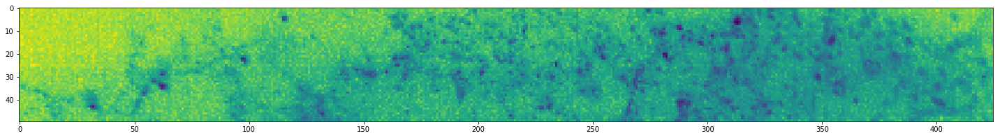

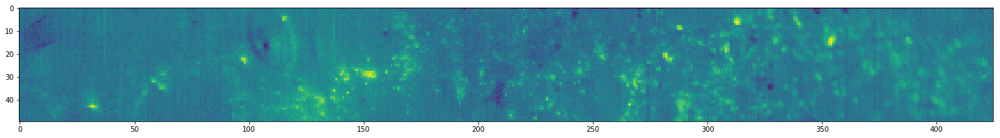

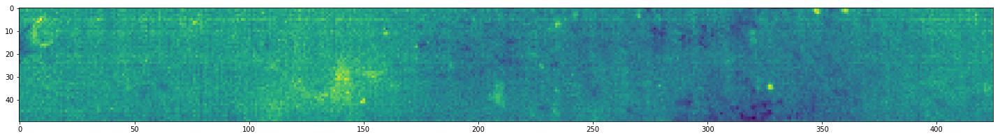

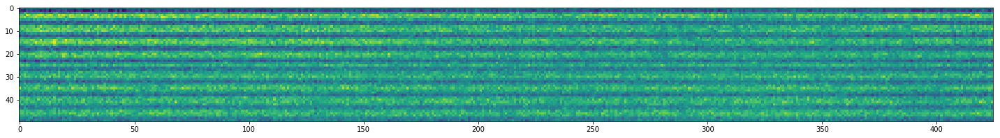

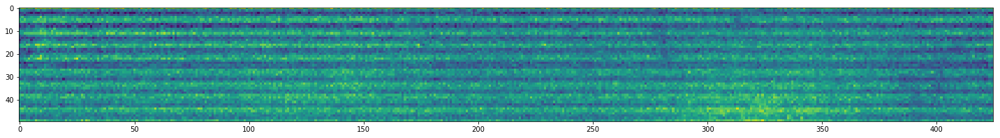

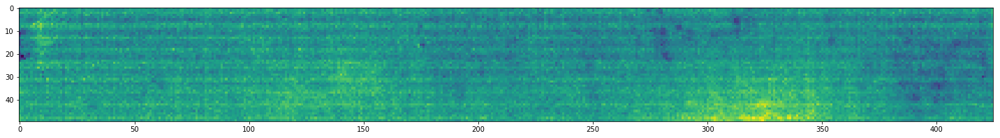

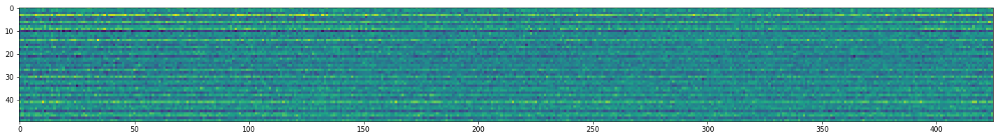

In [24]:
for i in range(k):
    #make bigger size
    fig = plt.figure(figsize=(25,25))
    plt.imshow(k_eigenVectors[:, i].reshape((pix_x, pix_y)))
    plt.show() 

In [25]:
#Matrix to perform ICA on

In [26]:
pca_data = np.dot(ims_std, k_eigenVectors)
print(pca_data.shape) #(7499, k)

(7082, 7)


In [27]:
#Perform ICA

In [28]:
from sklearn.decomposition import FastICA, PCA

ica = FastICA(n_components = k, max_iter = 3000, tol = 0.1)
S_1 = ica.fit_transform(pca_data)  # Reconstruct signals
A_1 = ica.mixing_  # Get estimated mixing matrix

In [29]:
#Source Matrix

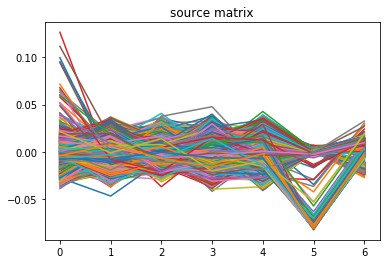

In [30]:
plt.plot(S_1.T)
plt.title('source matrix')
plt.show()

In [31]:
#Mixing Matrix

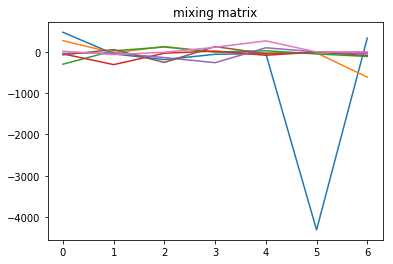

In [32]:
data_A = np.array(A_1) 
plt.plot(np.arange(k), data_A.transpose())
plt.title('mixing matrix')
plt.show()

In [33]:
#Unmixing matrix

In [34]:
W_1 = np.linalg.inv(A_1) #unmixing matrix
print(W_1.shape) #(k, k)

(7, 7)


In [35]:
#Linear Combinations

In [36]:
lc_1 = np.dot(W_1,k_eigenVectors.T) #Linear combinations
print(lc_1.shape) #(k, flat_pix)

(7, 21250)


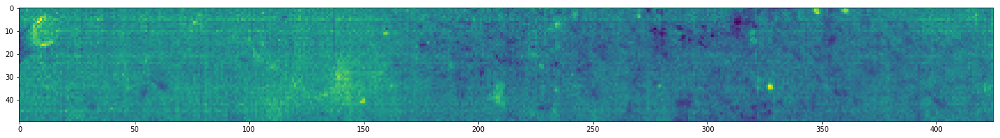

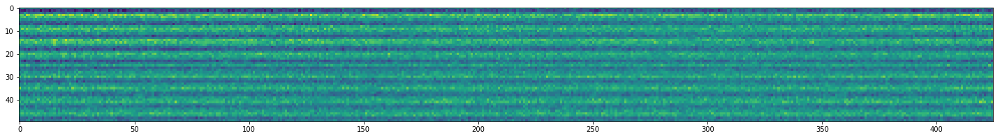

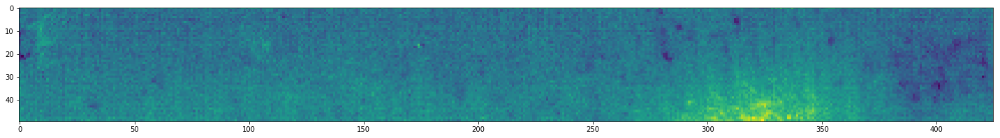

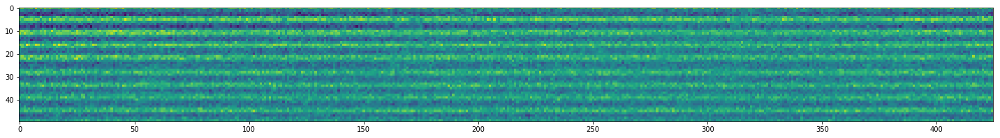

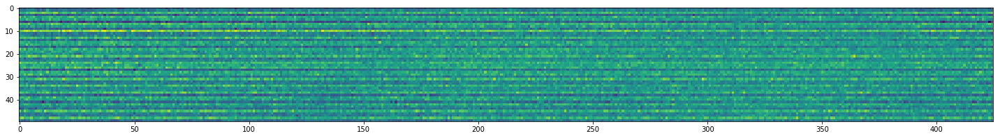

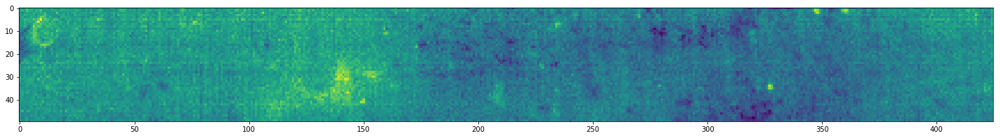

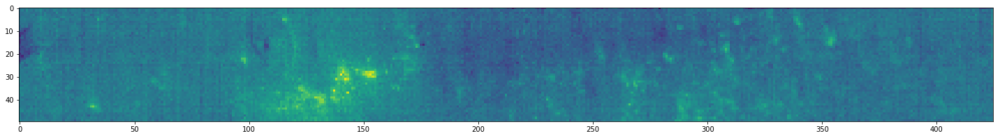

In [37]:
#Plot linear combinations
for i in range(k):
    #make bigger size
    fig = plt.figure(figsize=(25,25))
    plt.imshow(-lc_1[i,:].reshape((pix_x, pix_y)))
    plt.show() 

In [38]:
#ICA on whitened matrix

In [40]:
#diagonal matrix with the square root of the associated eigenvalues
D_1 = np.diag(k_eigenValues) #Diagonal matrix
print(D_1.shape) #(k, k)
E_1 = np.asarray(k_eigenVectors) 
print(E_1.shape) #(flat_pix, k)

D_1_inv = np.sqrt( np.linalg.inv(D_1) )
print(D_1_inv.shape) #(k, k)

(7, 7)
(21250, 7)
(7, 7)


In [41]:
#whitened matrix
whitened_mat_1 = np.dot(np.dot(D_1_inv, E_1.T), ims_std.T)
print(whitened_mat_1.shape) #(k, 7499)

(7, 7082)


In [42]:
whitened_mat_1_T = whitened_mat_1.T
print(whitened_mat_1_T.shape) #(7499, k)

(7082, 7)


In [43]:
from sklearn.decomposition import FastICA, PCA
ica_2 = FastICA(n_components = k, max_iter = 4000, tol = 0.1)
S_2 = ica_2.fit_transform(whitened_mat_1_T)  # Reconstruct signals
A_2 = ica_2.mixing_  # Get estimated mixing matrix

In [44]:
print(S_2.shape) #(7499, k)
print(A_2.shape) #(k, k)


(7082, 7)
(7, 7)


In [45]:
W_2 = np.linalg.inv(A_2) #unmixing matrix
print(W_2.shape) #(k, k)

(7, 7)


In [46]:
lc_2 = np.dot(W_2,k_eigenVectors.T) #Linear combinations
print(lc_2.shape) #(k, flat_pix)


(7, 21250)


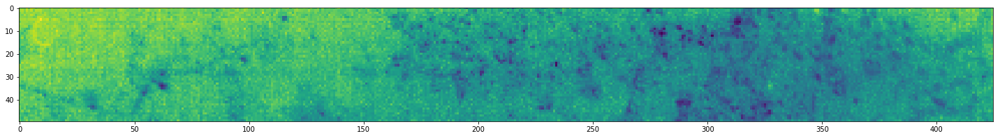

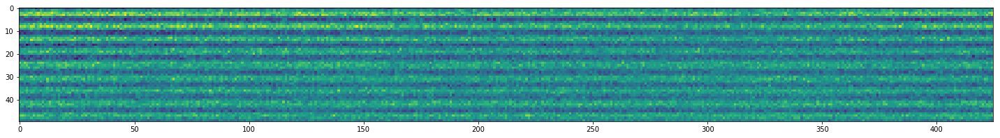

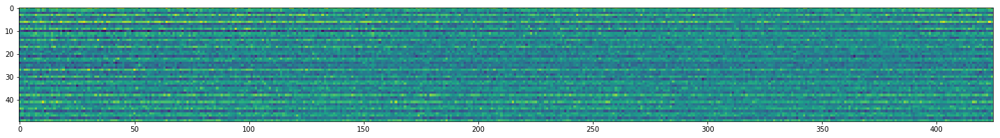

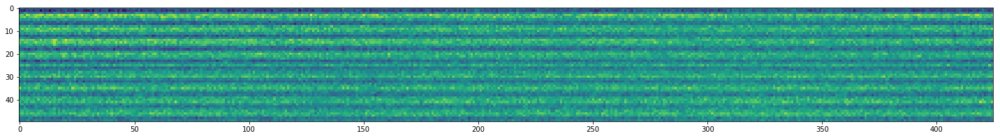

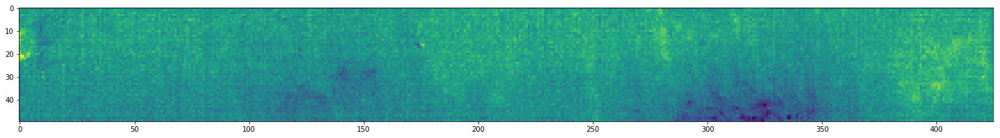

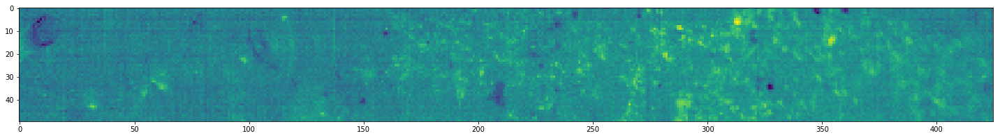

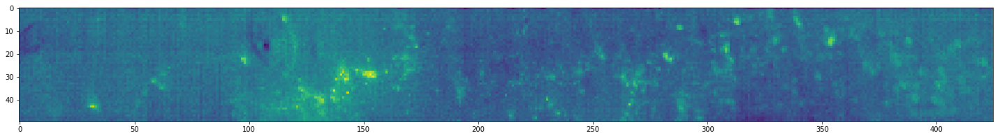

In [47]:
for i in range(k):
    #make bigger size
    fig = plt.figure(figsize=(25,25))
    plt.imshow(-lc_2[i,:].reshape((pix_x, pix_y)))
    plt.show() 
    



In [48]:
#After PCA ICA

In [49]:
#Temporal skewness of Independent Components
temporal_skewness = scipy.stats.skew(lc_2, axis = 1, bias = True)
print(temporal_skewness.shape) #(23040,)

(7,)


In [50]:
idx_skewness = temporal_skewness.argsort()[::-1]   
skewness = temporal_skewness[idx_skewness]
lc_3 = lc_2[idx_skewness, :]
print(skewness.shape)
print(lc_3.shape)



(7,)
(7, 21250)


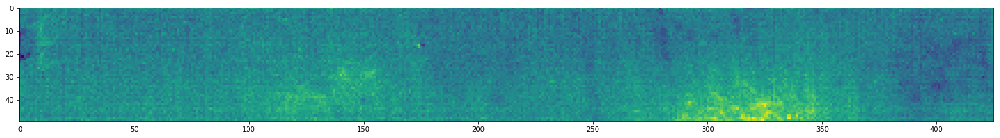

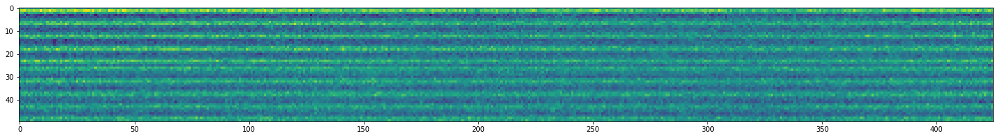

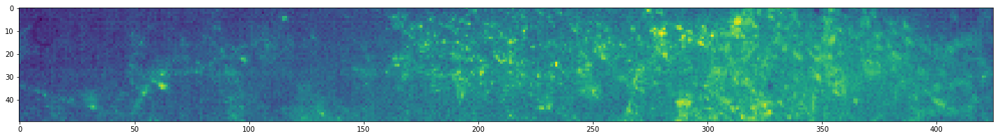

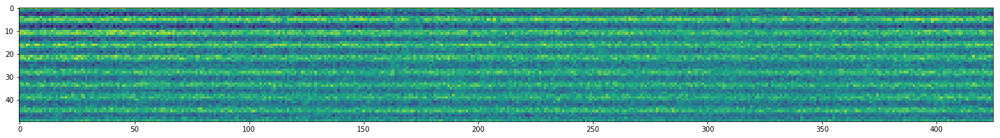

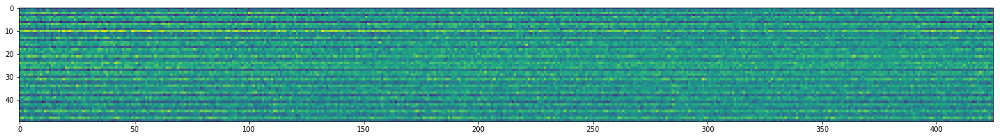

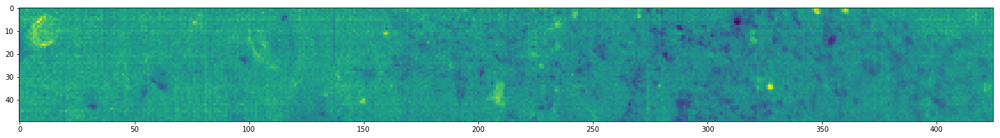

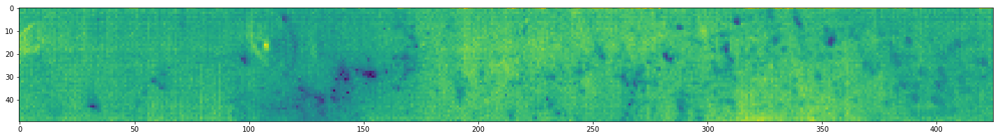

In [51]:
for i in range(k):
    #make bigger size
    fig = plt.figure(figsize=(25,25))
    plt.imshow(lc_3[i,:].reshape((pix_x, pix_y)))
    plt.show() 

In [52]:
def signaltonoise(a, axis=0, ddof=0):
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis=axis, ddof=ddof)
    return np.where(sd == 0, 0, m/sd)

#Returns the signal-to-noise ratio of the input data
signal_noise_ratio = signaltonoise(lc_2, axis=1, ddof=0)
print(signal_noise_ratio.shape)

(7,)


In [53]:
#Thresholding Algo

In [54]:
#Derive a threshold for neuron segmentation
 
from skimage import filters 
 
im = lc_2
print(im.shape)

#thresholds 
thresh_yen = filters.threshold_yen(im)
binary_yen = im > thresh_yen

thresh_otsu = filters.threshold_otsu(im)
binary_otsu = im > thresh_otsu

thresh_li = filters.threshold_li(im)
binary_li = im > thresh_li

thresh_iso = filters.threshold_isodata(im)
binary_iso = im > thresh_iso

thresh_mean = filters.threshold_mean(im)
binary_mean = im > thresh_mean

thresh_min = filters.threshold_minimum(im)
binary_min = im > thresh_min




(7, 21250)


In [55]:
#Find ic1 and ic2 ie, frames with neurons without manually looking

sum_pix = np.zeros(27)
for i  in range(len(lc_2)):
    mask_ind = [i for i, x in enumerate(binary_yen[i]) if x]
    len_mask_ind = len(mask_ind)
    im6_ =  im[i]
    mask_pix = [0 for i in range(pix_x*pix_y)]
    for j in range(len_mask_ind):
        mask_pix[mask_ind[j]] = im6_[mask_ind[j]]
    sum_pix[i] = sum(mask_pix)
    
print(sum_pix)

#sort sum_pix with indices
sorted_sum_pix = sorted(range(len(sum_pix)),key = sum_pix.__getitem__)
print(sorted_sum_pix)

[ 1.60486347 -0.04375459 -0.03643127  0.05429995 -0.07572139  0.53174259
 -0.09037423  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[6, 4, 1, 2, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 3, 5, 0]


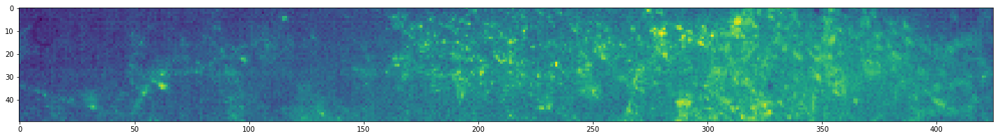

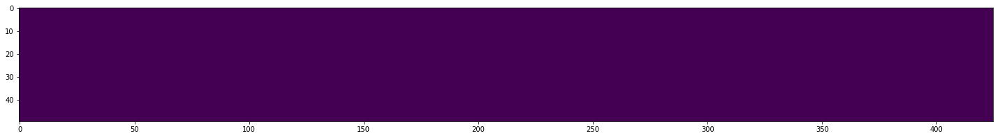

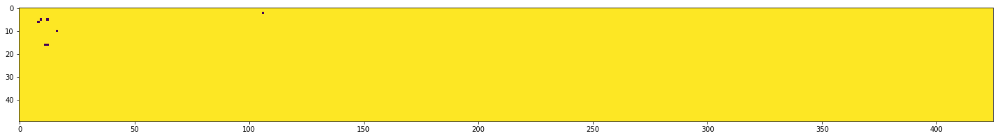

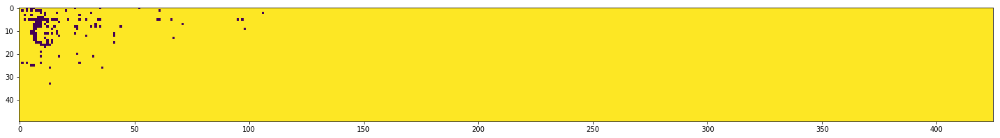

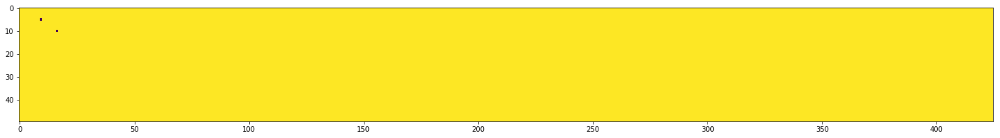

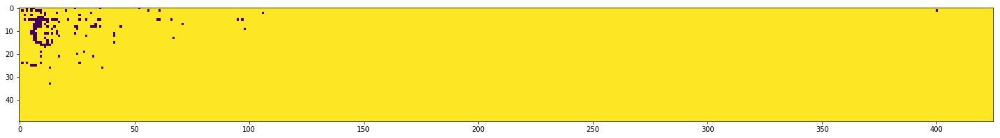

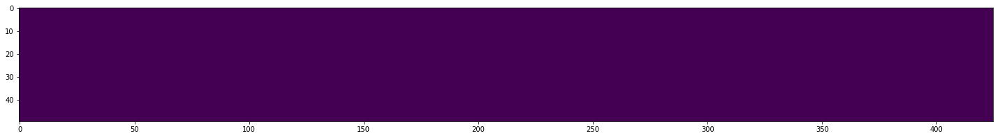

In [56]:
ic1= sorted_sum_pix[-1]
ic2= sorted_sum_pix[-2]


#make bigger size
fig = plt.figure(figsize=(25,25))
plt.imshow(im[ic1,:].reshape((pix_x, pix_y)))
plt.show()

#make bigger size
fig = plt.figure(figsize=(25,25))
plt.imshow(binary_yen[ic1,:].reshape((pix_x, pix_y)))
plt.show()

#make bigger size
fig = plt.figure(figsize=(25,25))
plt.imshow(binary_otsu[ic1,:].reshape((pix_x, pix_y)))
plt.show()

#make bigger size
fig = plt.figure(figsize=(25,25))
plt.imshow(binary_li[ic1,:].reshape((pix_x, pix_y)))
plt.show()

#make bigger size
fig = plt.figure(figsize=(25,25))
plt.imshow(binary_iso[ic1,:].reshape((pix_x, pix_y)))
plt.show()

#make bigger size
fig = plt.figure(figsize=(25,25))
plt.imshow(binary_mean[ic1,:].reshape((pix_x, pix_y)))
plt.show()

#make bigger size
fig = plt.figure(figsize=(25,25))
plt.imshow(binary_yen[ic1,:].reshape((pix_x, pix_y)))
plt.show()

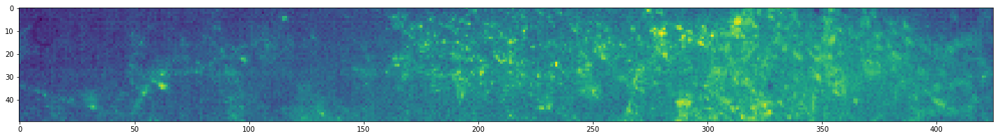

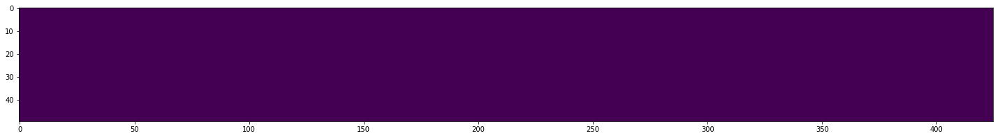

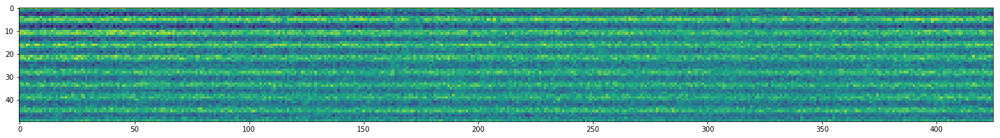

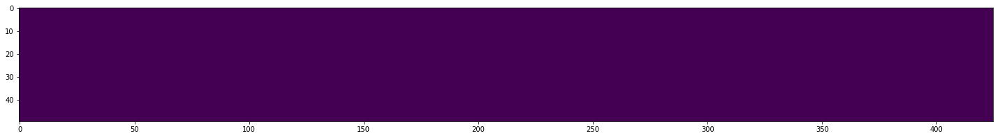

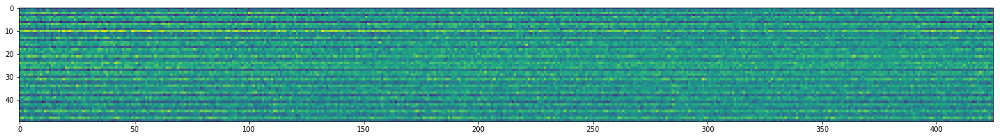

...

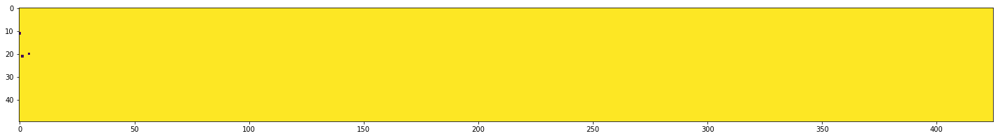

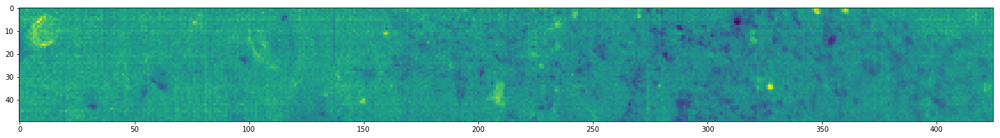

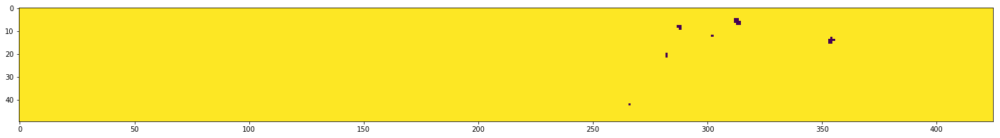

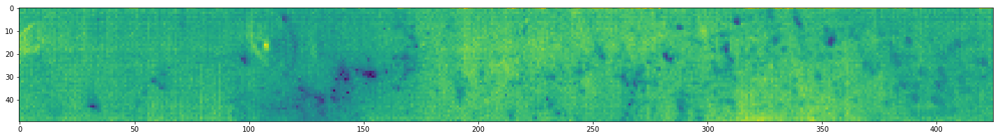

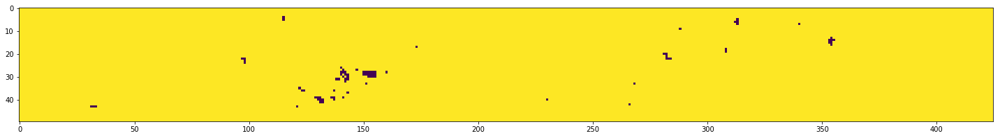

In [57]:

for i in range(k):
    #make bigger size
    fig = plt.figure(figsize=(25,25))
    plt.imshow(im[i,:].reshape((pix_x, pix_y)))
    plt.show() 
    
    fig = plt.figure(figsize=(25,25))
    plt.imshow(binary_yen[i,:].reshape((pix_x, pix_y)))
    plt.show()



In [11]:
#Constrained Non-negative Matrix Factorization (SickitLearn)
#Input matrix factorized into W and H
#H = Components matrix
#W = Weight of components matrix
#X = Weighted sum of components
#Decomposition:
#X = W H 


In [10]:
from sklearn.decomposition import NMF
# apply NMF
 
#nmf = NMF(n_components=100, solver="mu", max_iter=500)
nmf = NMF(n_components = 100, init='nndsvd', max_iter=500)
 
W = nmf.fit_transform(rm)
 
H = nmf.components_

#Minimize function : || X - W H || ^ 2 w.r.t W,H such that W, H > 0


In [12]:
#weight of components
print(W.shape)
#components
print(H.shape)

(7082, 100)
(100, 21250)


/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


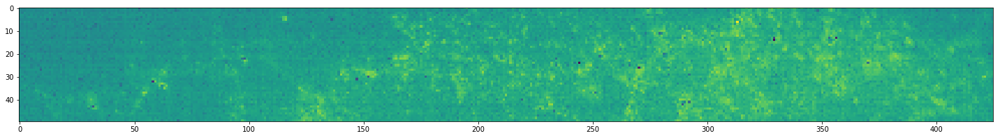

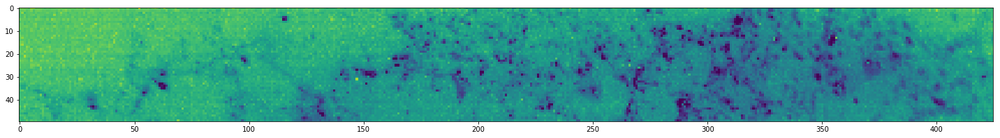

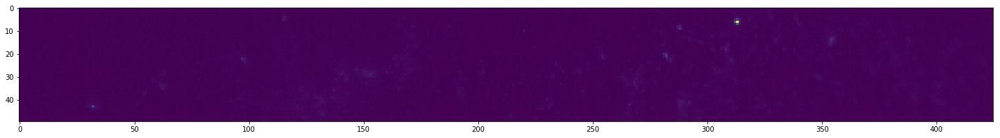

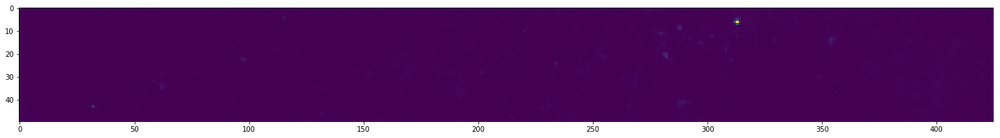

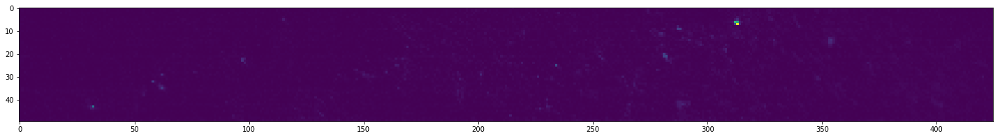

...

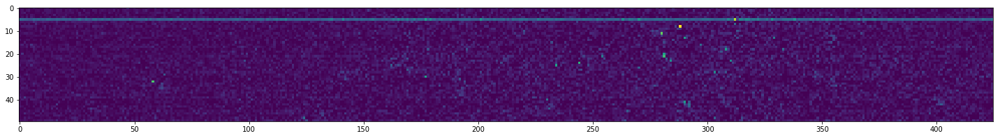

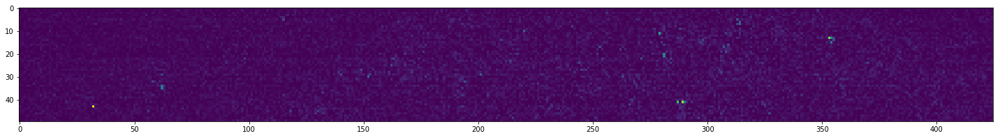

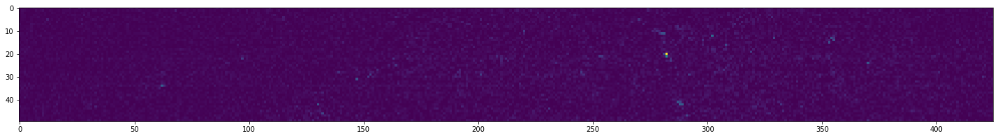

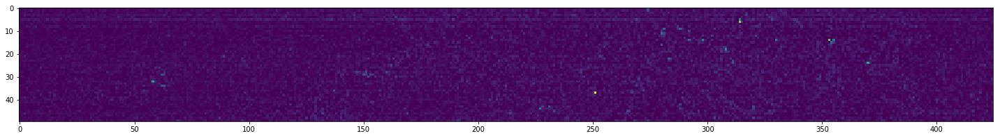

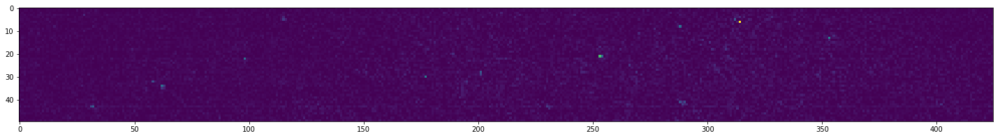

In [13]:
for i in range(100):
    fig = plt.figure(figsize=(25,25))
    plt.imshow(H[i,:].reshape((pix_x, pix_y)))  

In [14]:
approx = np.dot(W.T,rm)
print(approx.shape)

(100, 21250)


/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


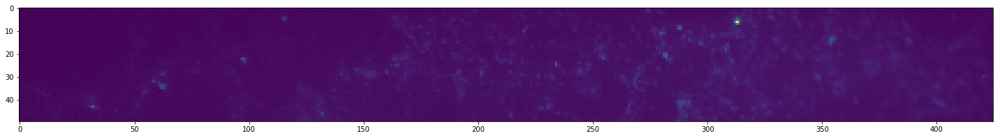

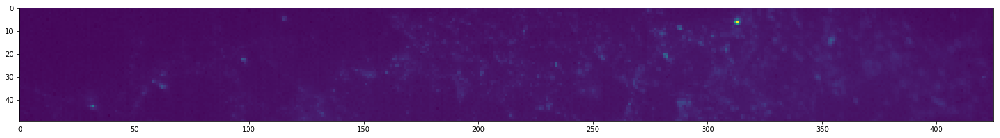

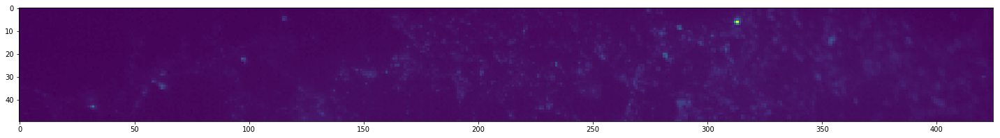

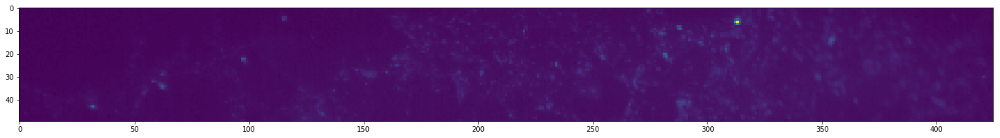

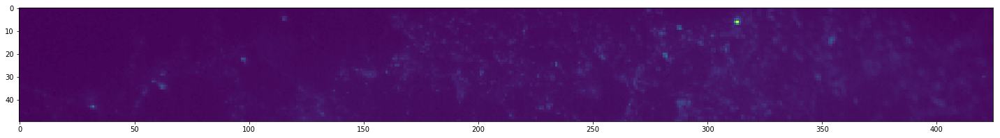

...

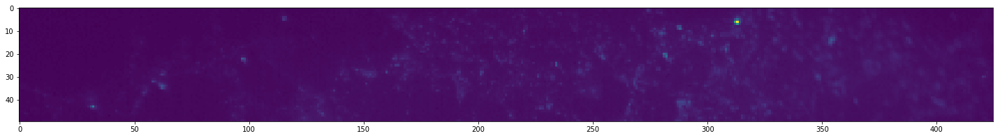

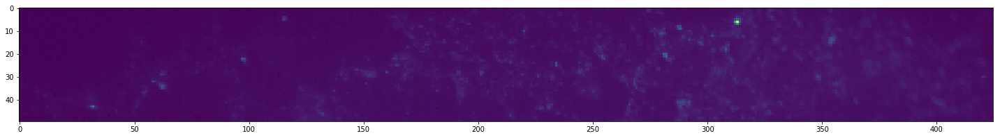

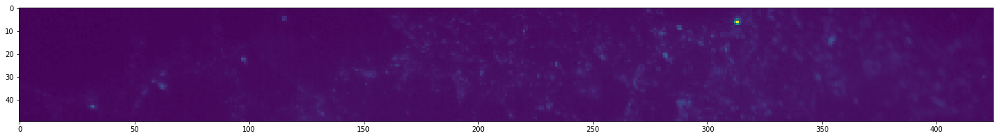

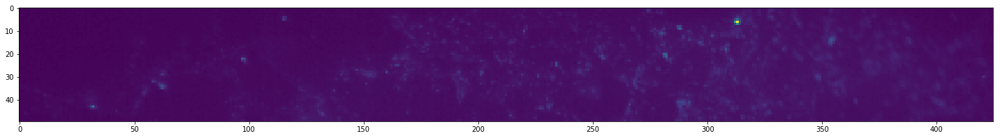

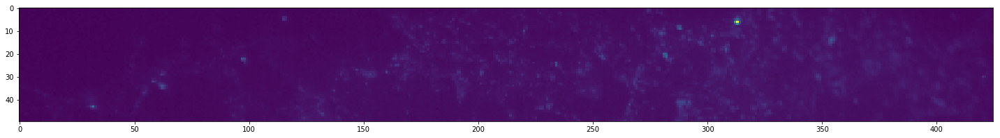

In [15]:
for i in range(100):
    fig = plt.figure(figsize=(25,25))
    plt.imshow(approx[i,:].reshape((pix_x, pix_y)))